In [61]:
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import seaborn as sns
import pandas as pd
from PIL import Image
from copy import deepcopy
import cv2
from datetime import datetime
import time
%matplotlib inline

In [62]:
csv_folder = "/Users/imrankabir/Desktop/research/vqa_accessibility/result_generator/data/result_april_4/output/csv"
out_path = "/Users/imrankabir/Desktop/research/vqa_accessibility/result_generator/data/result_april_4/output/long_csv"
video_path = "/Users/imrankabir/Desktop/research/vqa_accessibility/result_generator/data/video_data"
folder = f'{datetime.now().strftime("%Y_%m_%d-%I_%M_%S_%p")}'
output_path = f"/Users/imrankabir/Desktop/research/vqa_accessibility/result_generator/results/image_plots_teaser/{folder}"

if not os.path.exists(output_path):
    os.makedirs(output_path)

In [63]:
frame_selection = {
    'video-3-segment-2': [1, 2, 3, 4, 5, 6, 7], 
}

In [64]:
csv_files = [
    "/Users/imrankabir/Desktop/research/vqa_accessibility/result_generator/data/result_april_4/output/csv/video-3-segment-2.csv"
]

In [65]:
df = pd.read_csv(csv_files[0], index_col = [1])
df

,Unnamed: 0,Similarity (Human),gt cosine similarity,Similarity (VQA-based),GPV VQA cosine similarity,Similarity (Lavis-VQA-based),Lavis VQA cosine similarity,resnet-50 feature similarity,Similarity (Feature-based),alexnet feature similarity,vgg16-bn feature similarity,Similarity (Pixel-level)
frame pair,,,,,,,,,,,,
"frame-(0, 1)",0,1.000000,1.000000,0.800000,0.801784,0.933333,0.925820,0.881714,0.886233,0.916804,0.883186,0.558575
"frame-(1, 2)",1,0.785714,0.308607,0.866667,0.866025,0.933333,0.912871,0.832308,0.873630,0.824700,0.866069,0.535556
"frame-(2, 3)",2,0.785714,0.500000,0.733333,0.721688,0.866667,0.800000,0.873926,0.887075,0.871789,0.901499,0.582713
"frame-(3, 4)",3,1.000000,1.000000,0.800000,0.824958,1.000000,1.000000,0.796821,0.834184,0.859252,0.868240,0.583676
"frame-(4, 5)",4,0.785714,0.577350,0.733333,0.777778,0.733333,0.745356,0.627186,0.662204,0.417149,0.701868,0.563238
"frame-(5, 6)",5,0.857143,0.668153,0.600000,0.703527,0.733333,0.755929,0.856357,0.825693,0.750800,0.699156,0.652299
"frame-(6, 7)",6,0.785714,0.571429,0.666667,0.738549,0.666667,0.566947,0.816454,0.868733,0.796772,0.799327,0.643576
"frame-(7, 8)",7,0.642857,0.267261,0.733333,0.774597,0.666667,0.566947,0.844332,0.837814,0.843969,0.827717,0.646874
"frame-(8, 9)",8,0.714286,0.534523,0.733333,0.800000,0.666667,0.763763,0.856825,0.844328,0.818573,0.857248,0.646997


In [66]:
# dash_type = {
#     'gt similarity': 'solid', 
#     'VQA similarity': 'dot', 
#     'resnet-50 feature similarity': 'dash',
#     'resnet-152 feature similarity': 'longdash', 
#     'alexnet feature similarity': 'dashdot',
#     'vgg16-bn feature similarity': 'longdashdot', 
#     'ssim similarity': '5, 10, 2, 2'
# }

#     d_types = []
#     for lbl in df2['Label']:
#         d_t = dash_type[lbl]
#         d_types.append(d_t)

#     df2['dash_type'] = d_types

In [67]:
fig1 = px.scatter(x=[0, 1, 2, 3, 4], y=[0, 1, 4, 9, 16])
fig1.write_image(os.path.join(output_path, ".garbage.pdf"))

In [68]:
time.sleep(10)

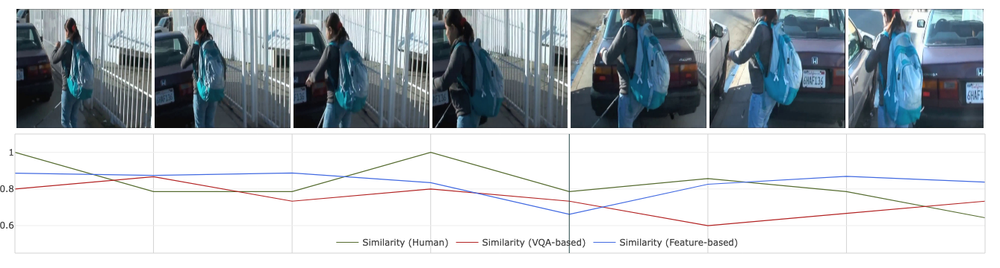

In [71]:
show_line = ["Similarity (Human)", "Similarity (VQA-based)", "Similarity (Feature-based)"]
select_line = [
    "Similarity (Human)", "Similarity (VQA-based)", "Similarity (Feature-based)"
]
color_v = ['darkolivegreen', 'firebrick', 'royalblue']
dash_type = ['solid', 'solid', 'solid']

for csv_file in csv_files:
    vid = csv_file.split('-')[1]
    seg = csv_file.split('-')[-1].split('.')[0]
    
    vid_sub_path = f"video_{vid.zfill(3)}/trimmed_video/keyframes_video_accss_{vid.zfill(3)}_elena_seg{seg.zfill(2)}.mp4"
    
    frame_selectors = frame_selection[os.path.basename(csv_file).split('.')[0]]
    
    frame_highlight = 4
    hlight_width = 40
    
    master_image = None
    for c, selection in enumerate(frame_selectors):
        image_name = f"video_accss_{vid.zfill(3)}_elena_seg{seg.zfill(2)}_{selection}.jpeg"
        img_path = os.path.join(
            video_path,
            vid_sub_path,
            image_name
        )
        image = np.array(Image.open(img_path).convert('RGBA'))
        h,w,_ = image.shape
        image = image[50:h-50, 100:w-100]  
        if c == frame_highlight-10:
            h,w,_ = image.shape
            # image[0:hlight_width, :] = [255, 217, 50, 200]
            # image[:, 0:hlight_width] = [255, 217, 50, 200]
            # image[-hlight_width:, :] = [255, 217, 50, 200]
            # image[:, -hlight_width:] = [255, 217, 50, 200]
            image = cv2.copyMakeBorder(
                image, 
                hlight_width, 
                hlight_width, 
                hlight_width, 
                hlight_width, 
                cv2.BORDER_CONSTANT, 
                value=[255, 217, 50, 200]
            )
            image = cv2.resize(image, (w, h), cv2.INTER_LINEAR)
        
        if master_image is None:
            pad = np.ones((image.shape[0], 10, 4))*255 
            master_image = np.concatenate([pad, image], axis=1) # deepcopy(image)
        else:
            pad = np.ones((image.shape[0], 24, 4))*255 
            master_image = np.concatenate([master_image, pad, image], axis=1)
            
    pad = np.ones((image.shape[0], 10, 4))*255 
    master_image = np.concatenate([master_image, pad], axis=1)
    
    # master_image = cv2.resize(master_image, (master_image.shape[1], master_image.shape[0]), cv2.INTER_LINEAR)
            
    # aspect_rat = master_image.shape[1] / master_image.shape[0]
    master_image = Image.fromarray(master_image.astype(np.uint8))
    # master_image.save('tmp.jpeg')
    # fig_img = px.imshow(master_image, height=230, width=1200)
    # fig_img.update_xaxes(showticklabels=False)
    # fig_img.update_yaxes(showticklabels=False)
    # fig_img.show()
    
    df = pd.read_csv(csv_file, index_col = [1])

    drp_row = []
    
    # for d_c in range(0, frame_selectors[1]):
    #     drp_row.append(str(df.index[d_c]))
        
    for d_c in range(frame_selectors[-1]+1, len(df.index)):
        drp_row.append(str(df.index[d_c]))
        
    df = df.drop(index=drp_row)
    df['frame pair'] = df.index
    
    df2 = pd.melt(
        df, id_vars=['frame pair'],
        var_name = 'Label',
        value_vars = select_line,
        value_name = 'Value'
    )
    df2.set_index(['frame pair'], inplace=True)
    df2['frame pair'] = df2.index
    # df2['color'] = df2.index
    # df2['dash_type'] = df2.index
    
    # for i, row in enumerate(df2.index):
    #     print(df2.iloc[i]['Label'])
    #     df2.iat[i, -2] = color_v[df2.iloc[i]['Label']]
    #     df2.iat[i, -1] = dash_type[df2.iloc[i]['Label']]
    
    df2.to_csv(
        os.path.join(
            out_path,
            os.path.basename(csv_file)
        )
    )

    fig = px.line(
        data_frame = df2,
        height=300,
        width=1200,
        x='frame pair',
        y='Value',
        color_discrete_sequence=color_v,
        line_dash='Label',
        line_dash_sequence=dash_type,
        color='Label',
        #title=f'Similarity between two frames({os.path.basename(csv_file).split(".")[0]})',
        template="gridon",
        range_y=(0.45, 1.1)
    ).update_traces(
        visible="legendonly", 
        selector=lambda t: not t.name in show_line,
    )
    
    fig.update_traces(
        line=dict(width=1.2)
    )
    

    fig.add_layout_image(
        dict(
            source=master_image,
            xref="paper", yref="paper",
            x=1, y=1.05,
            sizex=1, sizey=1,
            xanchor="right", yanchor="bottom",
            sizing="stretch",
        )
    )
    
    fig.update_layout(shapes=[go.layout.Shape(
        type='rect',
        xref='paper',
        yref='paper',
        x0=0,
        y0=0,
        x1=1,
        y1=1,
        line={'width': 1, 'color': 'lightgray'}
    )])
    
    fig.update_layout(
        margin=dict(l=20, r=20, t=180, b=20),
        yaxis_title=None,
        xaxis_title=None,
        xaxis= dict(
            showticklabels= False
        )
    )
    
    fig.update_layout(legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0,
        xanchor="right",
        x=0.75,
        bgcolor='rgba(0,0,0,0)',
        title=None
    ))
    
    fig.add_vline(x=frame_highlight, line_width=1, line_dash="solid", line_color="darkslategray")
    
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    # fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    
    fig.write_image(
        os.path.join(output_path, f"{os.path.basename(csv_file).split('.')[0]}.pdf"), 
        format='pdf'
    )
    
    fig.show()
    